# International Trade Network Analysis: Understanding Global Economic Interactions

International trade forms the backbone of the global economy, facilitating the exchange of goods, services, and resources between countries. The intricate web of trade relationships not only impacts national economies but also influences global economic stability and growth. Understanding these relationships is crucial for policymakers, economists, and business leaders alike. In this context, network analysis provides a powerful tool to unravel the complexities of international trade.

International trade networks are dynamic and complex. By analyzing these networks, we can uncover patterns, trends, and key players that shape global trade. Through centrality measures we can identify countries that play a central role in the trade network. These central countries often act as major hubs, influencing trade flows and economic policies.

In [1]:
import json
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import numpy as np
from scipy import stats
import csv
from collections import defaultdict
from collections import Counter
from plotly.subplots import make_subplots

from utils_single import *

Matplotlib is building the font cache; this may take a moment.


In [2]:
with open('countries.json', 'r') as file:
    data = json.load(file)

# 1. Network Creation
## Data Preprocessing

In [3]:
# We retrieve only the countries that have all the followings informations
key_mapping = {
        "Economy: Real GDP (purchasing power parity)": "GDP",
        "Economy: GDP - composition, by end use - exports of goods and services": "GDP% Exports",
        "Economy: GDP - composition, by end use - imports of goods and services": "GDP% Imports",
        "Economy: Exports": "Exports $",
        "Economy: Exports - partners": "Export Partners",
        "Economy: Exports - commodities": "Export Commodities",
        "Economy: Imports": "Imports $",
        "Economy: Imports - partners": "Import Partners",
        "Economy: Imports - commodities": "Import Commodities",
        "Geography: Geographic coordinates": "Coordinates"
    }

old_keys = list(key_mapping.keys())
data = {country: data[country] for country in data if all(key in data[country] for key in old_keys)}

In [4]:
# Loop over each country and its associated data in the 'data' dictionary.
for country, country_data in data.items():
    # Create a new dictionary 'filtered_renamed_data' that maps old keys to new keys (if they exist in 'key_mapping').
    # The loop filters out keys that are not in 'old_keys'.
    filtered_renamed_data = {key_mapping.get(key, key): value for key, value in country_data.items() if key in old_keys}
    
    # Update the 'data' dictionary with the filtered and renamed data for each country.
    data[country] = filtered_renamed_data

In [ ]:
# Loop over each country's data to clean up percentage values by removing '%' and any text after a space and parentheses.
for country_data in data.values():
    for key, value in country_data.items():
        # Extract the part of the value before the first occurrence of ' (' and remove the '%' sign.
        tempval = value.split(' (')[0]
        # Update the value in the dictionary after stripping the '%' sign.
        country_data[key] = tempval.strip('%')

In [ ]:
# Loop over each country's data to process export and import partners.
for country_data in data.values():
    # Process the 'Export Partners' string, splitting it into individual partner entries.
    export_partners_str = country_data['Export Partners']
    export_partners = export_partners_str.split(', ')

    # Create a new dictionary to hold the export partners and their associated percentages.
    export_partner_associations = {}

    # Loop over each partner string to separate the partner's name and the percentage.
    for partner_str in export_partners:
        last_space_index = partner_str.rfind(' ')
        partner = partner_str[:last_space_index]  # Extract the partner's name.
        percentage = partner_str[last_space_index+1:]  # Extract the percentage.
        percentage = percentage.replace(',', '')  # Remove commas from the percentage.
        percentage = percentage.replace('%', '')  # Remove the '%' sign.

        # Add the partner and percentage to the 'export_partner_associations' dictionary.
        export_partner_associations[partner] = percentage

    # Update the 'Export Partners' entry in the country's data with the new dictionary.
    country_data['Export Partners'] = export_partner_associations

    # Similar process for 'Import Partners'.
    import_partners_str = country_data['Import Partners']
    import_partners = import_partners_str.split(', ')

    # Create a new dictionary to hold the import partners and their associated percentages.
    import_partner_associations = {}

    # Loop over each partner string to separate the partner's name and the percentage.
    for partner_str in import_partners:
        last_space_index = partner_str.rfind(' ')
        partner = partner_str[:last_space_index]  # Extract the partner's name.
        percentage = partner_str[last_space_index+1:]  # Extract the percentage.
        percentage = percentage.replace(',', '')  # Remove commas from the percentage.
        percentage = percentage.replace('%', '')  # Remove the '%' sign.

        # Add the partner and percentage to the 'import_partner_associations' dictionary.
        import_partner_associations[partner] = percentage

    # Update the 'Import Partners' entry in the country's data with the new dictionary.
    country_data['Import Partners'] = import_partner_associations

In [ ]:
# Loop over each country's data to convert coordinates into decimal format.
for country_data in data.values():
    coordinates = country_data.get("Coordinates")
    if coordinates:
        # Convert the coordinates to decimal format using the 'convert_to_decimal' function.
        country_data["Coordinates"] = convert_to_decimal(coordinates)

In [5]:
country_mapping = {
    'UK': 'United Kingdom',
    'US': 'United States',
    'UAE': 'United Arab Emirates',
    'Gambia, The': 'Gambia',
    'Turkey (Turkiye)': 'Turkey',
    'Congo, Democratic Republic of the': 'Congo',
    'Democratic Republic of the Congo': 'Congo',
    'Congo, Republic of the': 'Congo',
    'Republic of the Congo': 'Congo',
    'Korea, South': 'South Korea',
    'Korea, North': 'North Korea',
    'Cost Rica': 'Costa Rica',
    'NZ': 'New Zealand',
    'Micronesia, Federated States of': 'Micronesia',
    'Bahamas, The': 'Bahamas'
}

### Dataframes Creation

In [6]:
# Create exports dataframe and node attributes
trade_df, node_attributes = create_df(data, country_mapping)
trade_df

,source,target,weight,type
0,Afghanistan,United Arab Emirates,45.0,Export
1,Afghanistan,Pakistan,24.0,Export
2,Afghanistan,India,22.0,Export
3,Afghanistan,China,1.0,Export
4,United Arab Emirates,Afghanistan,23.0,Import
...,...,...,...,...
1964,Zimbabwe,South Africa,23.0,Export
1965,Zimbabwe,Mozambique,9.0,Export
1966,South Africa,Zimbabwe,41.0,Import
1967,Singapore,Zimbabwe,23.0,Import


## Network

In [7]:
G = create_graph(trade_df, node_attributes)

# Check number of nodes
num_nodes = G.number_of_nodes()
print(f"Number of nodes in the graph: {num_nodes}")

# Check number of edges
num_edges = G.number_of_edges()
print(f"Number of edges in export graph: {num_edges}")

# Check number of edges by type
edge_types = nx.get_edge_attributes(G, 'type')
num_exports = sum(1 for edge_type in edge_types.values() if edge_type == 'Export')
num_imports = sum(1 for edge_type in edge_types.values() if edge_type == 'Import')
print(f"Number of export edges: {num_exports}")
print(f"Number of import edges: {num_imports}")

# Print attributes of a sample node in the graph
sample_node = list(G.nodes())[0]  # Get the first node
print(f"\nSample node attributes in the graph ({sample_node}):")
print(G.nodes[sample_node])

Number of nodes in the graph: 209
Number of edges in export graph: 1845
Number of export edges: 916
Number of import edges: 929

Sample node attributes in the graph (Afghanistan):
{'GDP': 0.060802, 'Exports $': 0.0014759999999999999, 'Exports GDP%': '6.7', 'Imports $': 0.006983, 'Imports GDP%': '-47.6', 'Export Commodities': ['gold', 'figs', 'grapes', 'cotton', 'fruits and nuts', 'coal'], 'Import Commodities': ['wheat flours', 'broadcasting equipment', 'refined petroleum', 'rolled tobacco', 'aircraft parts', 'synthetic fabrics'], 'x': 65.0, 'y': 33.0}


In [9]:
cote_ivoire = convert_to_decimal("5 20 N, 4 01 W")
G.nodes['Cote d\'Ivoire']['x'] = cote_ivoire.get('lon')
G.nodes['Cote d\'Ivoire']['y'] = cote_ivoire.get('lat')

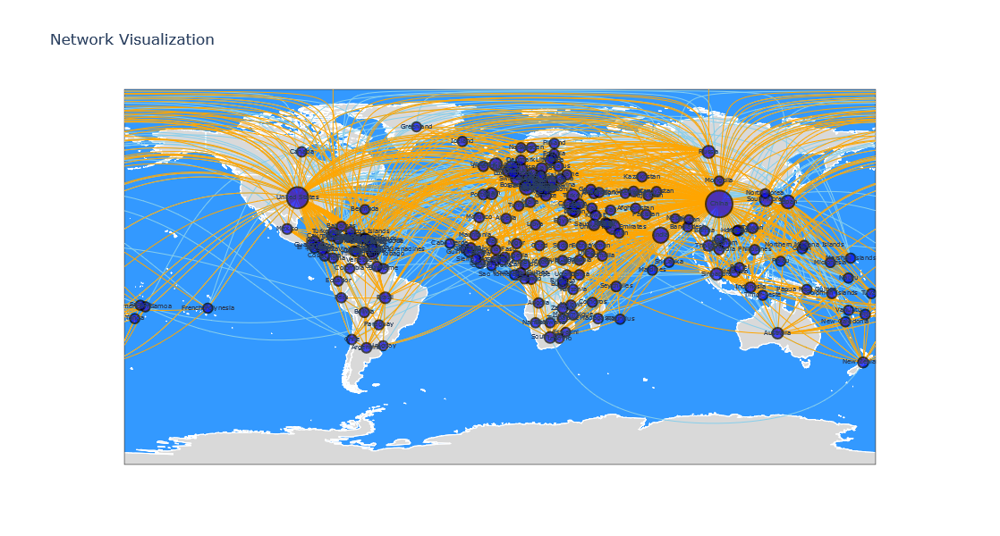

In [10]:
degree_centrality = nx.degree_centrality(G)
plot_network_on_world_map(G, degree_centrality, title='Network Visualization')

# 2. Measures

## Degree Centrality

Degree centrality measures the number of direct connections a node has. In the context of a trade network, it indicates the number of trade partners a country has. A higher degree centrality means that a country has more direct trade relationships, suggesting its central role in the network.

In [32]:
def centrality(cent, type, color='skyblue'):
    # Sort countries and their centrality values in descending order by centrality
    sorted_items = sorted(cent.items(), key=lambda item: -item[1])
    
    # Extract the top ten and worst ten countries
    top_ten_items = sorted_items[:10]
    worst_ten_items = sorted_items[-10:]

    # Extract country names and centrality values for top ten and worst ten
    top_ten_countries = [item[0] for item in top_ten_items]
    top_ten_centrality_values = [item[1] for item in top_ten_items]

    worst_ten_countries = [item[0] for item in worst_ten_items]
    worst_ten_centrality_values = [item[1] for item in worst_ten_items]

    # Create subplots
    fig = make_subplots(rows=1, cols=2, subplot_titles=('Top 10 Countries by ' + type, 'Bottom 10 Countries by ' + type))

    # Add bar chart for top ten countries
    fig.add_trace(go.Bar(
        x=top_ten_countries,
        y=top_ten_centrality_values,
        marker_color=color,
        name='Top 10'
    ), row=1, col=1)

    # Add bar chart for worst ten countries
    fig.add_trace(go.Bar(
        x=worst_ten_countries,
        y=worst_ten_centrality_values,
        marker_color='lightcoral',
        name='Bottom 10'
    ), row=1, col=2)

    # Update layout
    fig.update_layout(
        title=type + ' of Nodes',
        xaxis=dict(tickangle=270, tickfont=dict(size=10)),
        yaxis_title=type,
        height=500
    )

    # Customize individual x-axes for better readability
    fig.update_xaxes(title_text="Country", tickangle=270, tickfont=dict(size=10), row=1, col=1)
    fig.update_xaxes(title_text="Country", tickangle=270, tickfont=dict(size=10), row=1, col=2)

    fig.show()

-----Exports Network-----


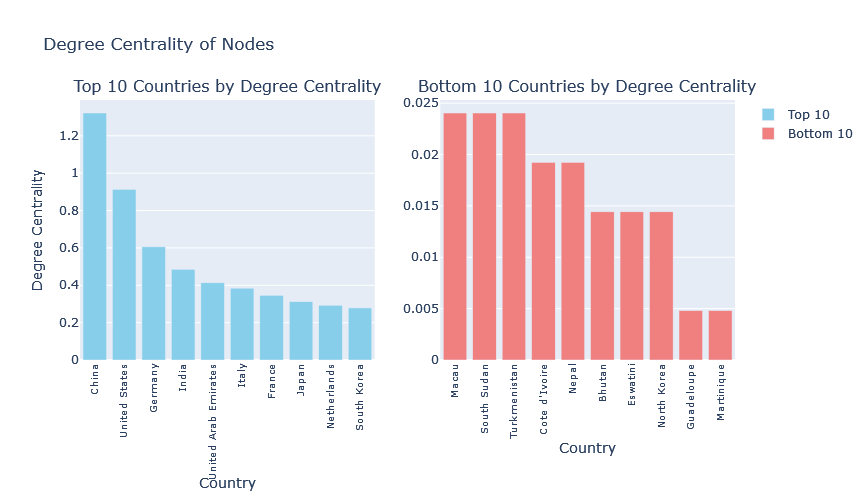

NameError: name 'threshold' is not defined

In [31]:
print("-----Exports Network-----")
high_degree_nodes = centrality(degree_centrality, type='Degree Centrality')

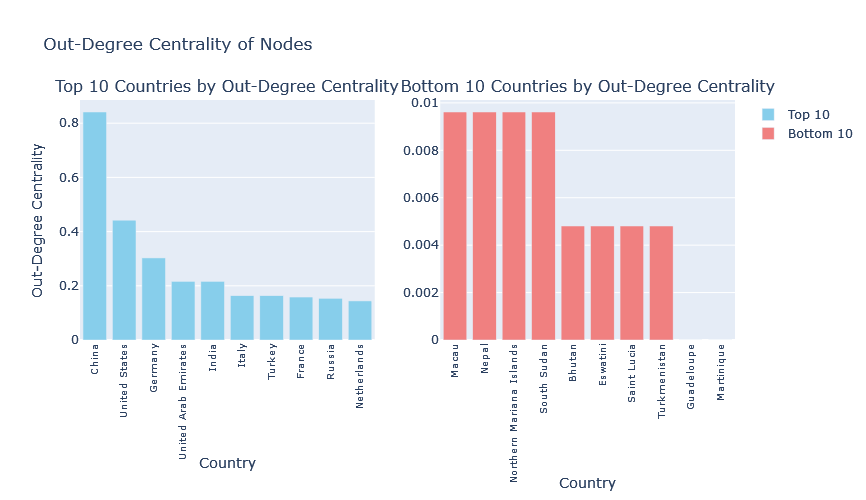

Nodes (Countries) with High Out-Degree Centrality (> 0.1):
China: 0.8413
United States: 0.4423
Germany: 0.3029
United Arab Emirates: 0.2163
India: 0.2163
Italy: 0.1635
Turkey: 0.1635
France: 0.1587
Russia: 0.1538
Netherlands: 0.1442
Japan: 0.1442
Singapore: 0.1250
South Korea: 0.1202
Brazil: 0.1010


In [26]:
out_degree_centrality = nx.out_degree_centrality(G)
high_in_degree_nodes = centrality(out_degree_centrality, type='Out-Degree Centrality',threshold=0.1)

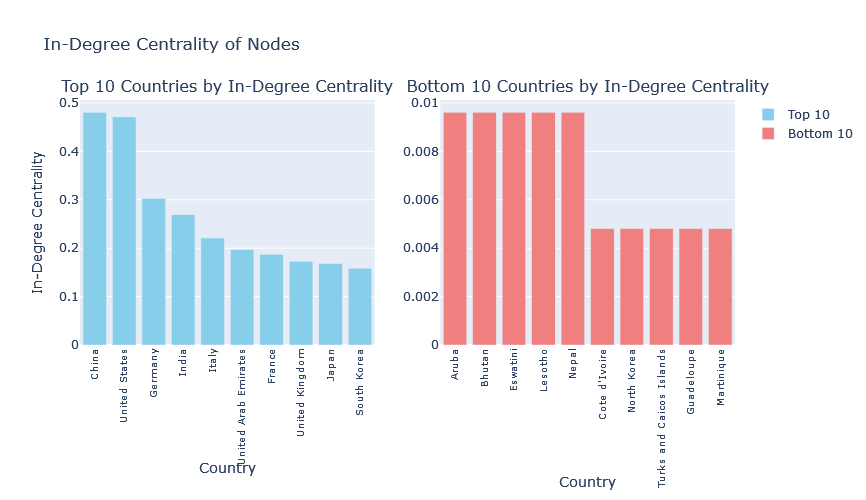

Nodes (Countries) with High In-Degree Centrality (> 0.1):
China: 0.4808
United States: 0.4712
Germany: 0.3029
India: 0.2692
Italy: 0.2212
United Arab Emirates: 0.1971
France: 0.1875
United Kingdom: 0.1731
Japan: 0.1683
South Korea: 0.1587
Netherlands: 0.1490
Switzerland: 0.1394
Spain: 0.1154
Russia: 0.1010


In [27]:
in_degree_centrality = nx.in_degree_centrality(G)
high_in_degree_nodes = centrality(in_degree_centrality, type='In-Degree Centrality',threshold=0.10)

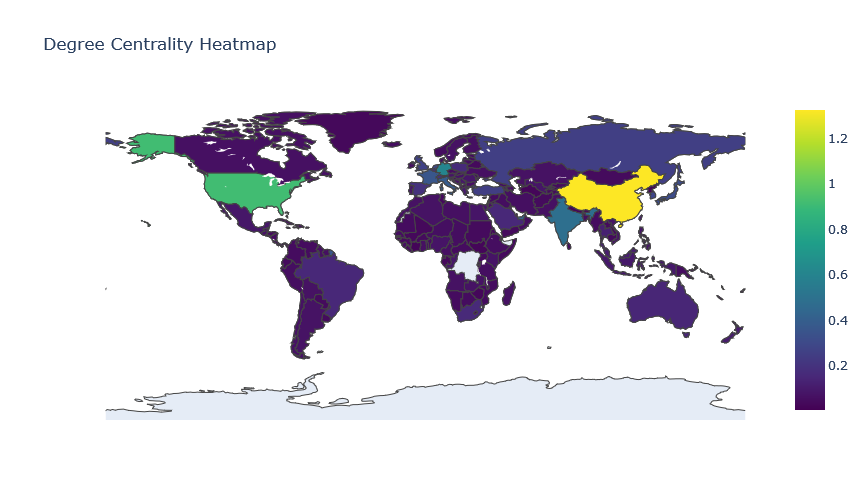

In [21]:
centrality_heatmap(degree_centrality, type='Degree Centrality')

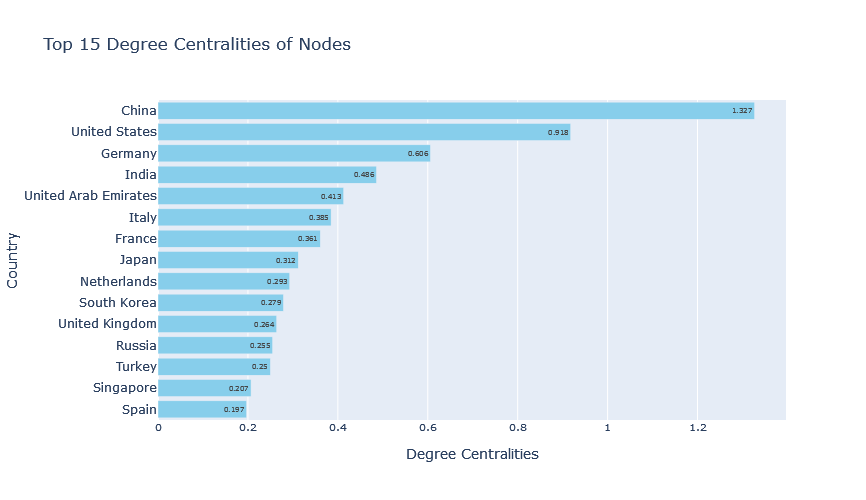

In [22]:
top_centrality(degree_centrality, type='Degree Centralities', top_n=15, color='skyblue')

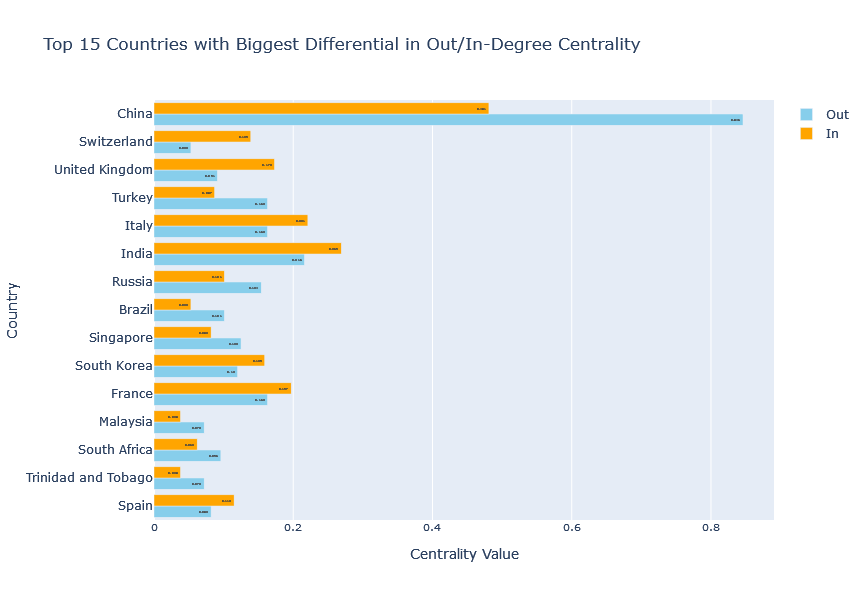

In [23]:
top_centrality_diff(out_degree_centrality, in_degree_centrality, typello='Out/In-Degree Centrality', type1='Out', type2='In', top_n=15, color1='skyblue', color2='orange')

### Degree Centrality Distribution

The degree centrality distribution is crucial for understanding the connectivity pattern within a trade network. Fitting this distribution to a power law can reveal whether the network has a scale-free structure, characterized by a few highly connected nodes (hubs) and many nodes with fewer connections. This is significant because it indicates the presence of dominant countries that act as major trade hubs, which can have substantial implications for network resilience, trade flow efficiency, and economic influence.

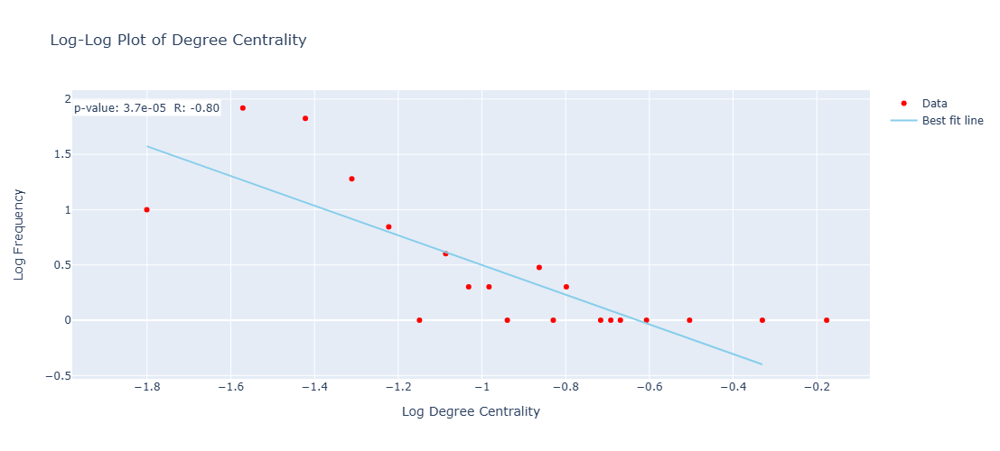

The slope of the line is: -1.3418444864534338


In [26]:
slope = plot_centrality_power_law(degree_centrality, bins=60, type='Degree', color='skyblue')

### Cumulative Distribution for Degree Centrality

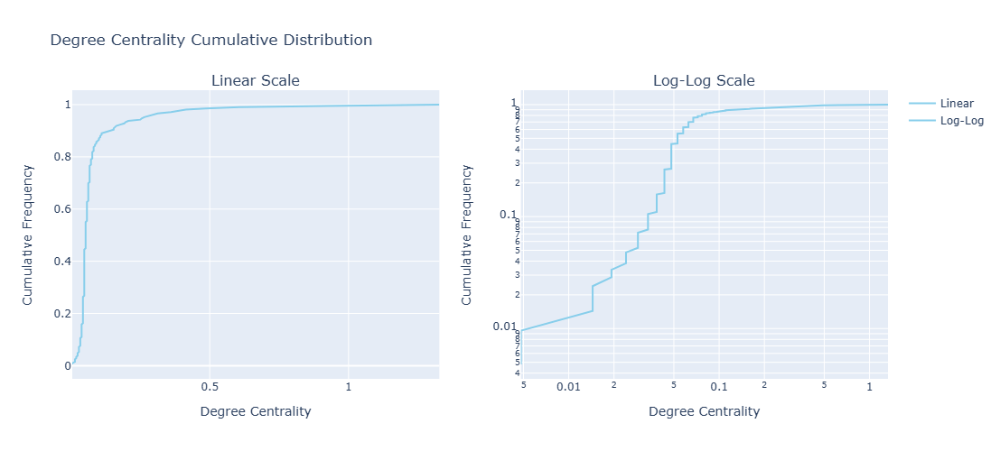

In [28]:
cumulative_distribution(degree_centrality,type='Degree', color='skyblue')

## Pagerank

PageRank is a measure of the importance of nodes in a network, taking into account both the quantity and quality of incoming links. In the context of trade, it indicates the overall importance of a country within the global trade network. A high PageRank score suggests that a country is a significant hub, attracting substantial trade from other countries.

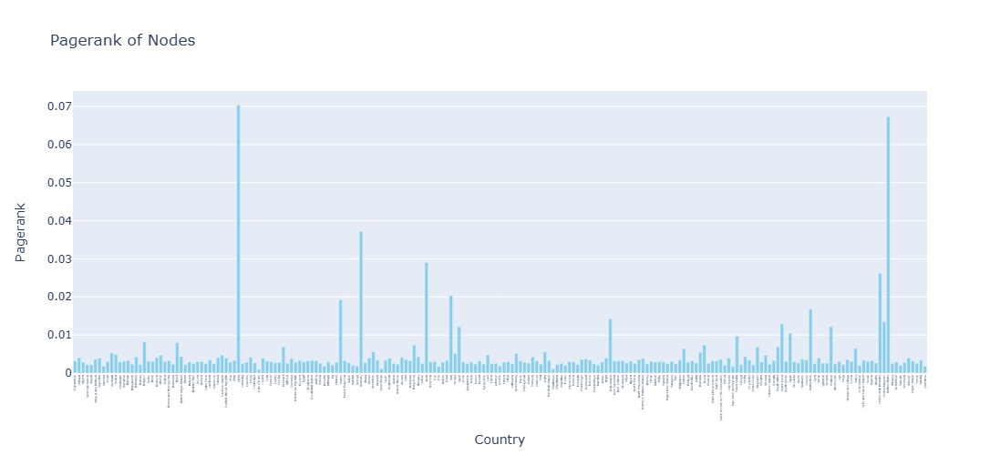

Nodes (Countries) with High Pagerank (> 0.015):
China: 0.0704
United States: 0.0673
Germany: 0.0372
India: 0.0290
United Arab Emirates: 0.0262
Italy: 0.0203
France: 0.0192
Switzerland: 0.0168


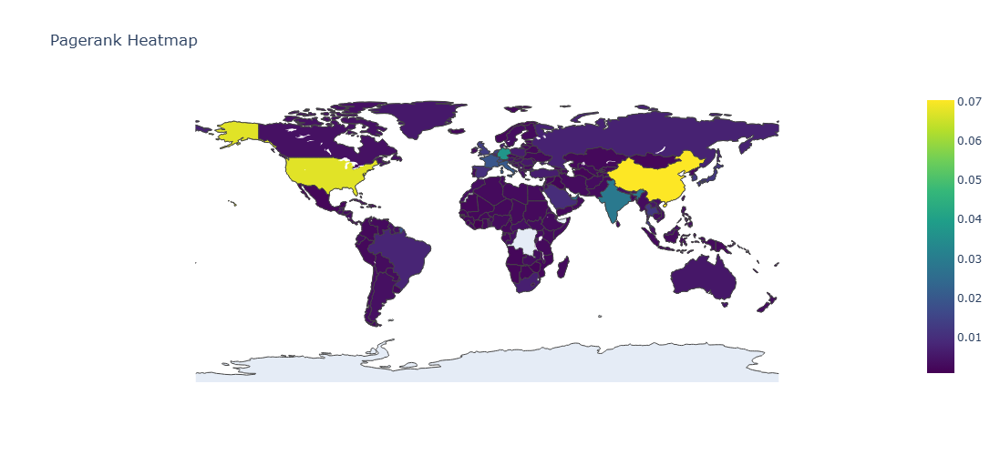

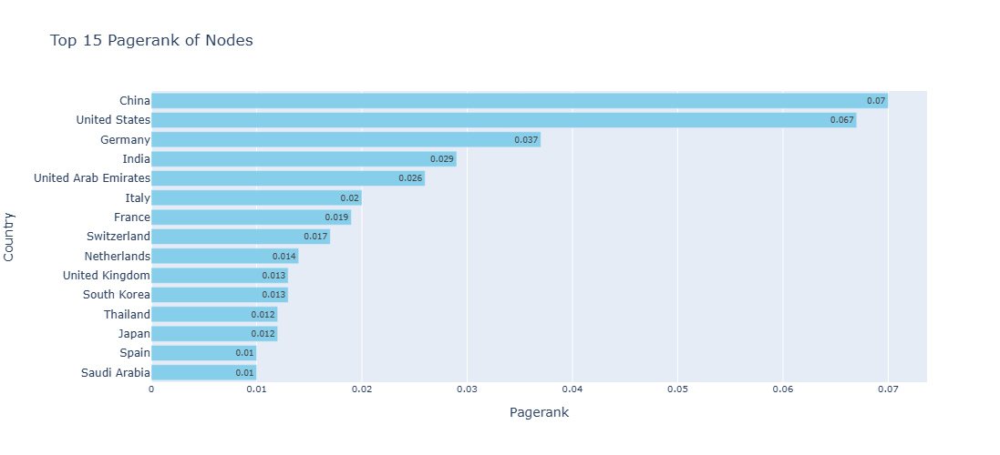

In [31]:
pagerank = nx.pagerank(G)

high_pagerank_nodes = centrality(pagerank, type='Pagerank',threshold=0.015, color='skyblue')
centrality_heatmap(pagerank, type='Pagerank')
top_centrality(pagerank, type='Pagerank', top_n=15, color='skyblue')

### Pagerank Distribution

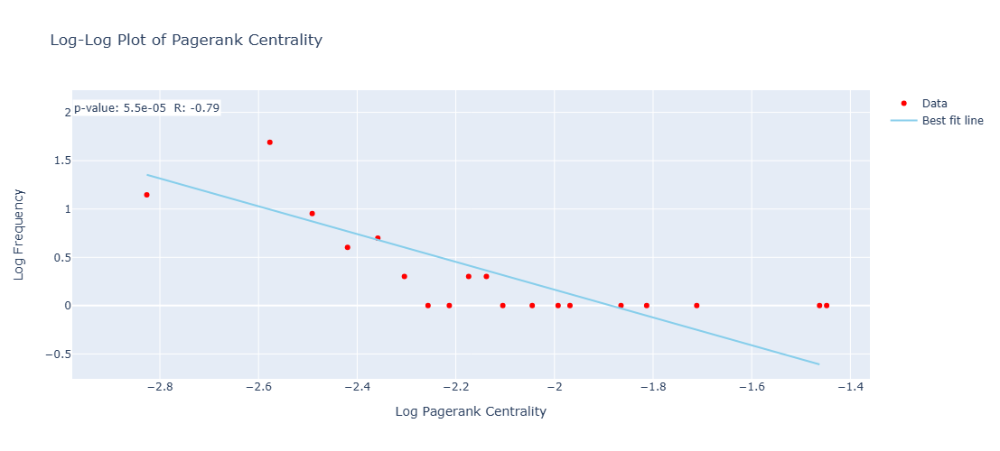

The slope of the line is: -1.4385490447802998


In [33]:
slope = plot_centrality_power_law(pagerank, bins=60, type='Pagerank', color='skyblue')

### Cumulative Distribution for Pagerank

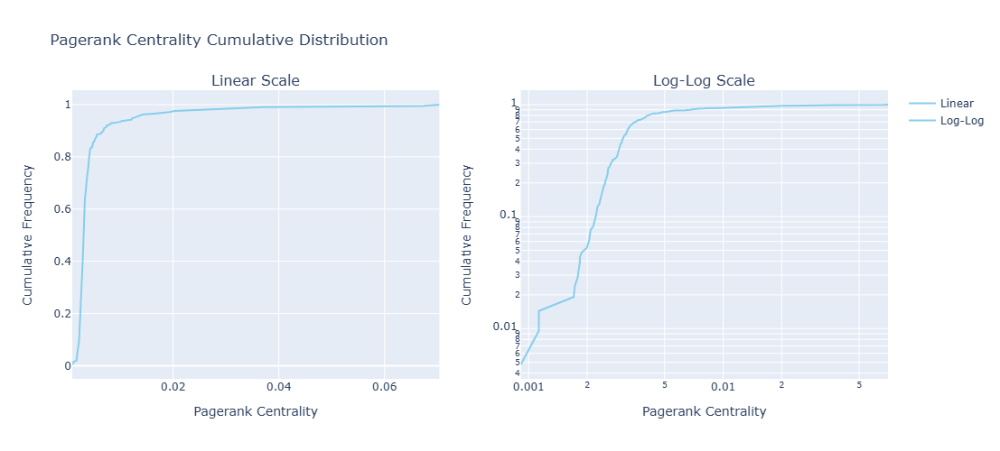

In [43]:
cumulative_distribution(pagerank,type='Pagerank', color='skyblue')

## Hyperlink-Induced Topic Search (HITS)

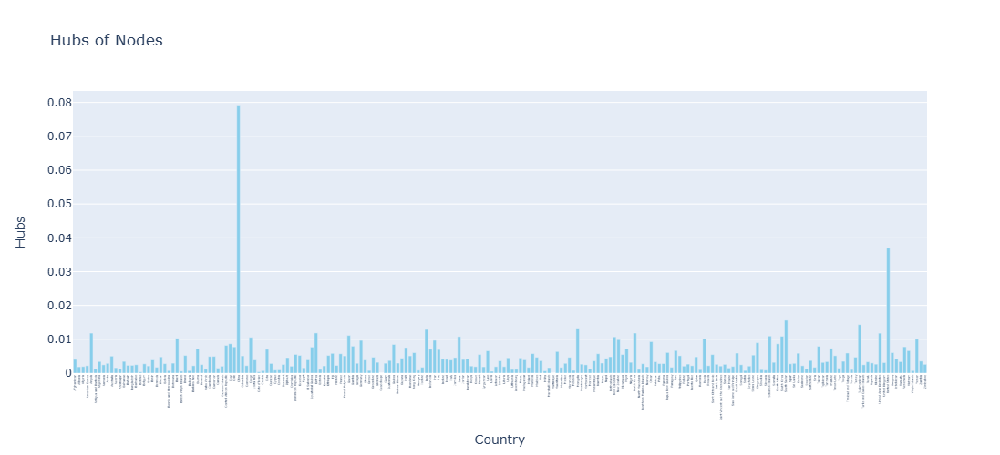

Nodes (Countries) with High Hubs (> 0.01):
China: 0.0792
United States: 0.0370
South Sudan: 0.0156
Turkmenistan: 0.0143
Mongolia: 0.0133
India: 0.0129
Eritrea: 0.0119
North Korea: 0.0118
Angola: 0.0118
United Arab Emirates: 0.0118
Gabon: 0.0111
Solomon Islands: 0.0110
South Korea: 0.0109
Japan: 0.0108
New Caledonia: 0.0107
Congo: 0.0106
Brazil: 0.0103
Russia: 0.0102
Yemen: 0.0100


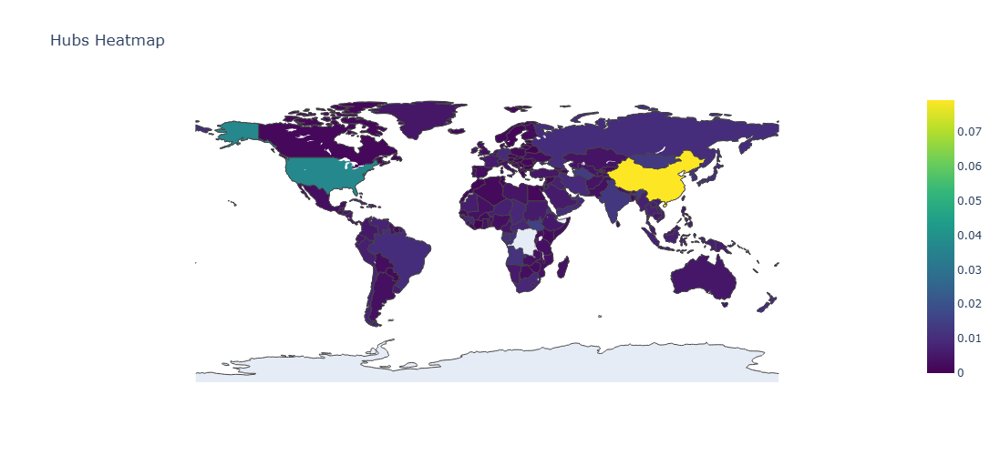

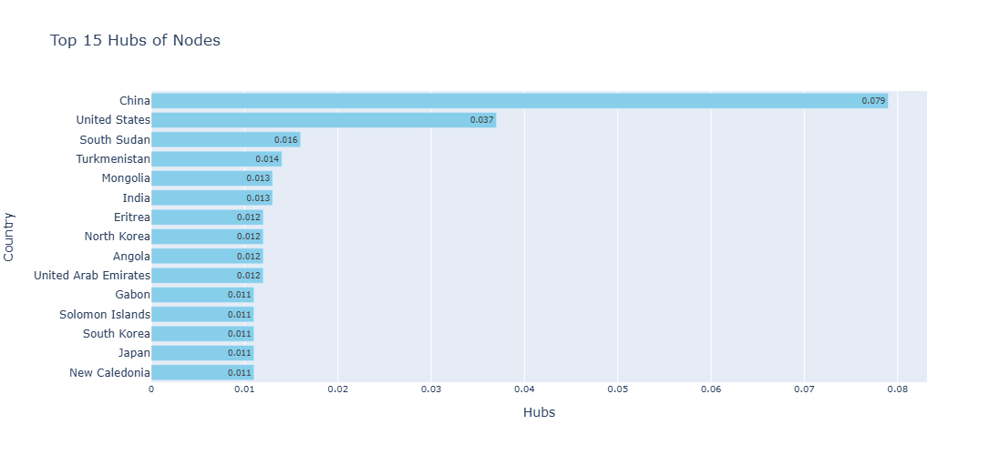

In [57]:
hubs, authorities = nx.hits(G)

nub_nodes = centrality(hubs, type='Hubs',threshold=0.01, color='skyblue')
centrality_heatmap(hubs, type='Hubs')
top_centrality(hubs, type='Hubs', top_n=15, color='skyblue')

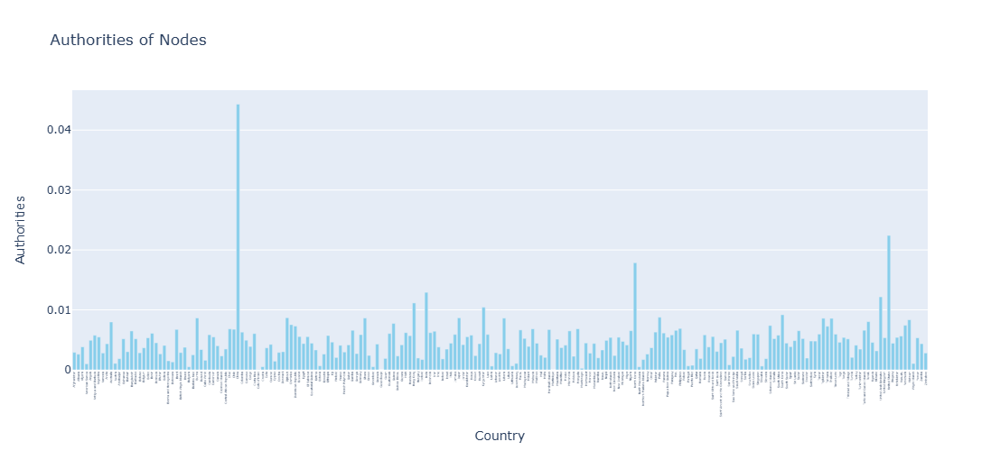

Nodes (Countries) with High Authorities (> 0.01):
China: 0.0443
United States: 0.0224
North Korea: 0.0179
India: 0.0129
United Arab Emirates: 0.0122
Hong Kong: 0.0112
Kyrgyzstan: 0.0104


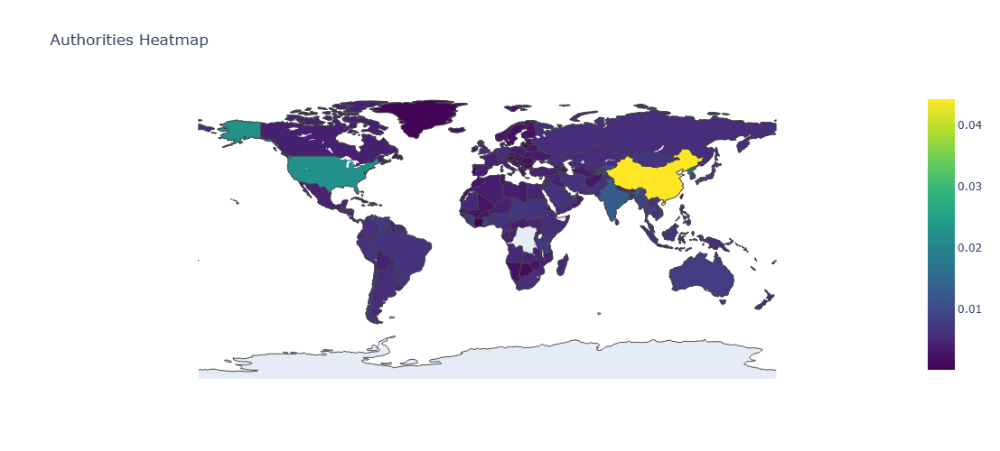

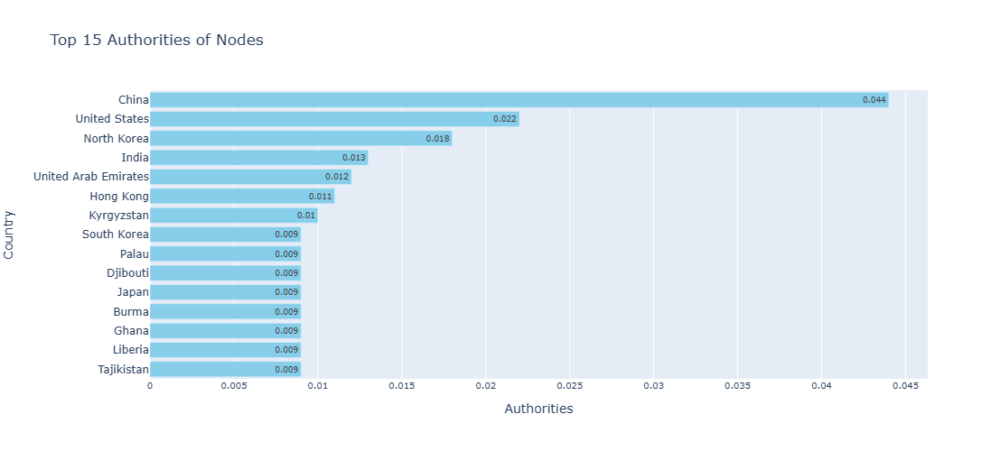

In [58]:
authority_nodes = centrality(authorities, type='Authorities',threshold=0.01, color='skyblue')
centrality_heatmap(authorities, type='Authorities')
top_centrality(authorities, type='Authorities', top_n=15, color='skyblue')

## Betweenness centrality

Betweenness centrality measures the extent to which a node lies on the shortest paths between other nodes. In trade networks, it indicates the countries that act as intermediaries in trade routes, controlling the flow of goods between other nations. A country with high betweenness centrality has significant influence over trade flow and can impact the efficiency of global trade routes.

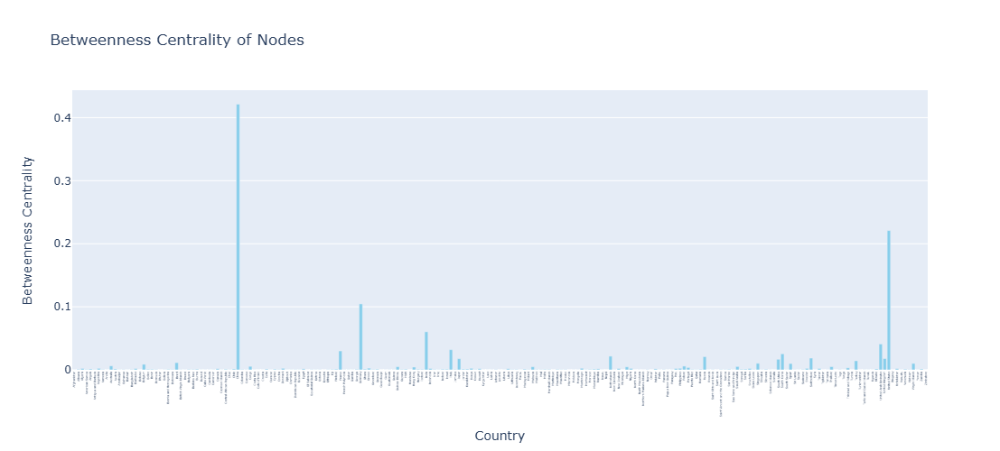

Nodes (Countries) with High Betweenness Centrality (> 0.015):
China: 0.4214
United States: 0.2209
Germany: 0.1046
India: 0.0603
United Arab Emirates: 0.0409
Italy: 0.0319
France: 0.0300
South Korea: 0.0254
Netherlands: 0.0216
Russia: 0.0208
Switzerland: 0.0186
United Kingdom: 0.0179
Japan: 0.0177
South Africa: 0.0167


In [63]:
betweenness_centrality = nx.betweenness_centrality(G)

high_betweenness_nodes = centrality(betweenness_centrality, type='Betweenness Centrality',threshold=0.015, color='skyblue')

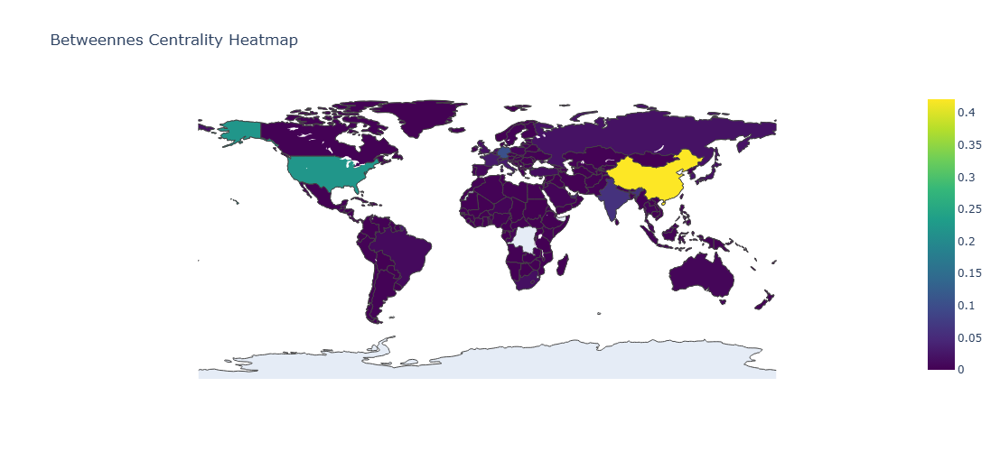

In [65]:
centrality_heatmap(betweenness_centrality, type='Betweennes Centrality')

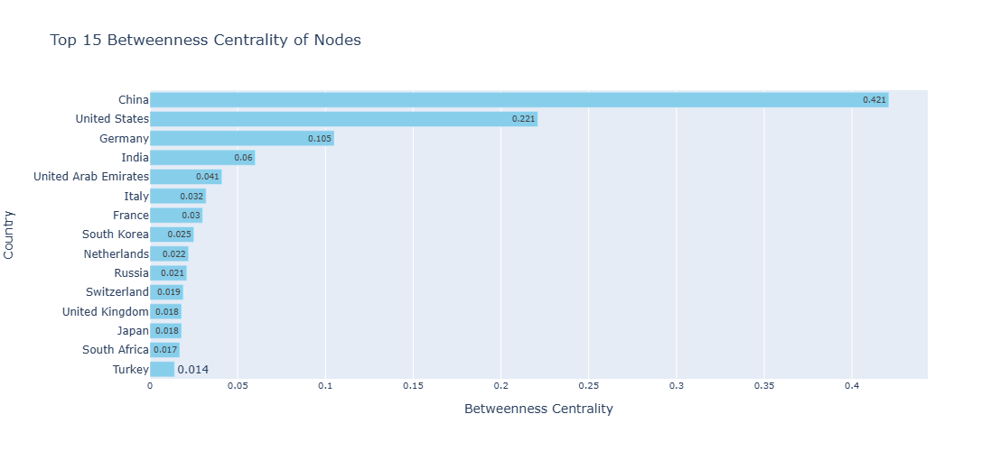

In [67]:
top_centrality(betweenness_centrality, type='Betweenness Centrality', top_n=15, color='skyblue')

### Betweenness Centrality Distribution

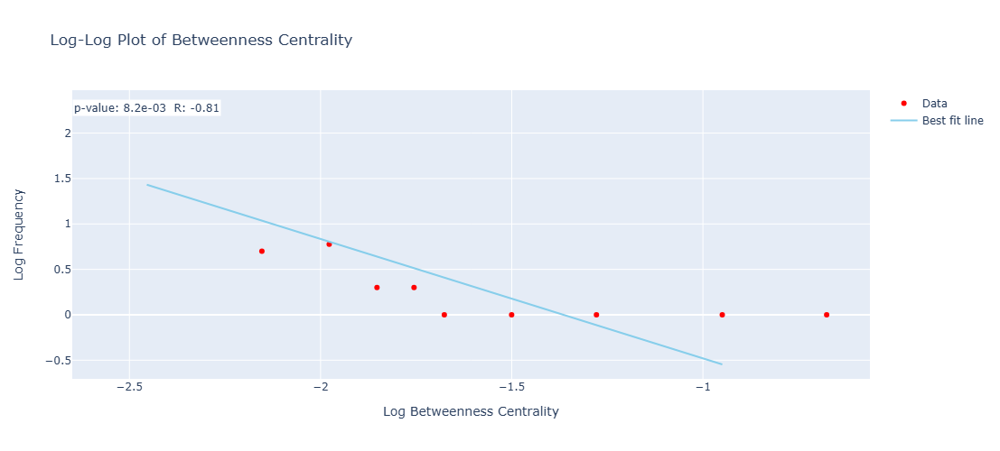

The slope of the line is: -1.314512331069772


In [70]:
slope = plot_centrality_power_law(betweenness_centrality, bins=60, type='Betweenness', color='skyblue')

### Cumulative Distribution for Betweenness Centrality 

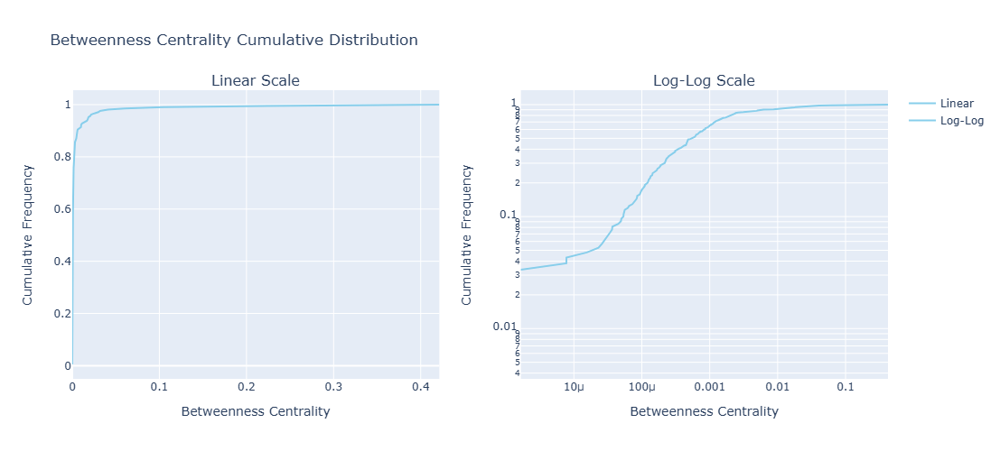

In [77]:
cumulative_distribution(betweenness_centrality,type='Betweenness', color='skyblue')

## Closeness centrality

Closeness centrality measures how quickly a node can reach all other nodes in the network. In a trade network, it indicates how efficiently a country can access other countries' markets. A higher closeness centrality suggests that a country is geographically or economically well-positioned to trade with others, reducing trade costs and improving market access.

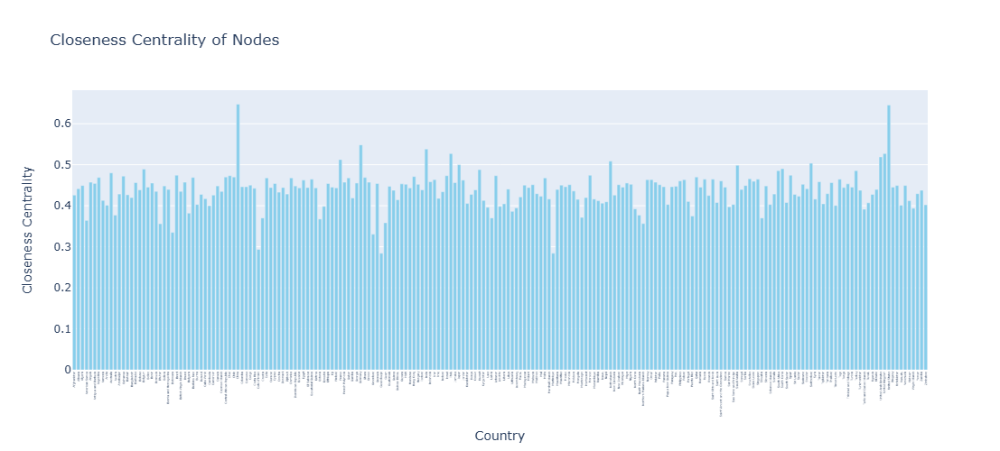

Nodes (Countries) with High Closeness Centrality (> 0.49):
China: 0.6477
United States: 0.6456
Germany: 0.5484
India: 0.5383
Italy: 0.5272
United Kingdom: 0.5272
United Arab Emirates: 0.5191
France: 0.5126
Netherlands: 0.5088
Switzerland: 0.5038
Japan: 0.5000
Saudi Arabia: 0.4988
South Korea: 0.4904


In [81]:
closeness_centrality = nx.closeness_centrality(G)

high_closeness_nodes = centrality(closeness_centrality, type='Closeness Centrality',threshold=0.49, color='skyblue')

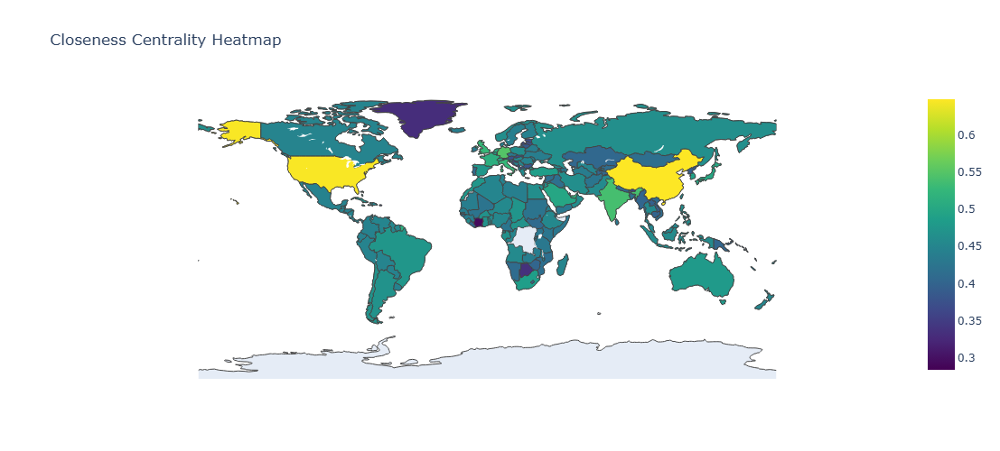

In [83]:
centrality_heatmap(closeness_centrality, type='Closeness Centrality')

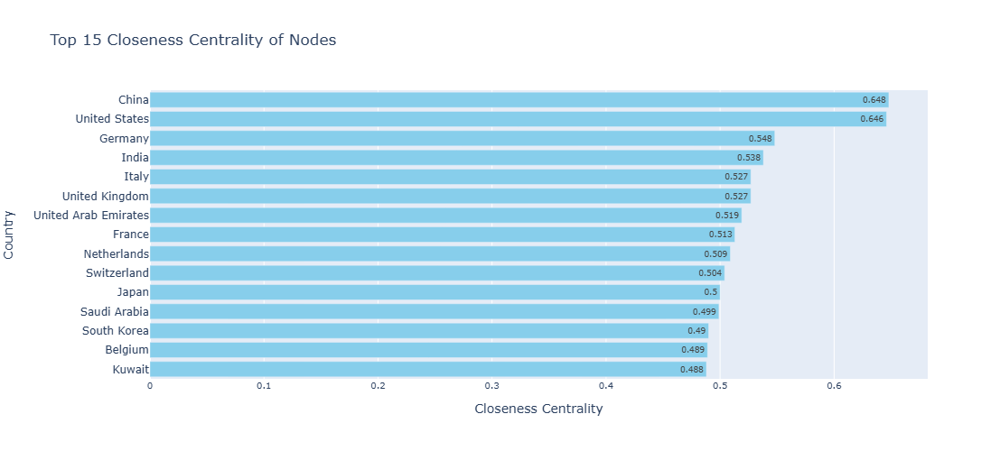

In [85]:
top_centrality(closeness_centrality, type='Closeness Centrality', top_n=15, color='skyblue')

## Local Clustering coefficient

The clustering coefficient measures the degree to which nodes in a graph tend to cluster together. In trade networks, it indicates the extent to which countries tend to form trade blocs or regional trade agreements. A higher clustering coefficient suggests that countries tend to trade more with their neighbors, forming tightly-knit clusters.

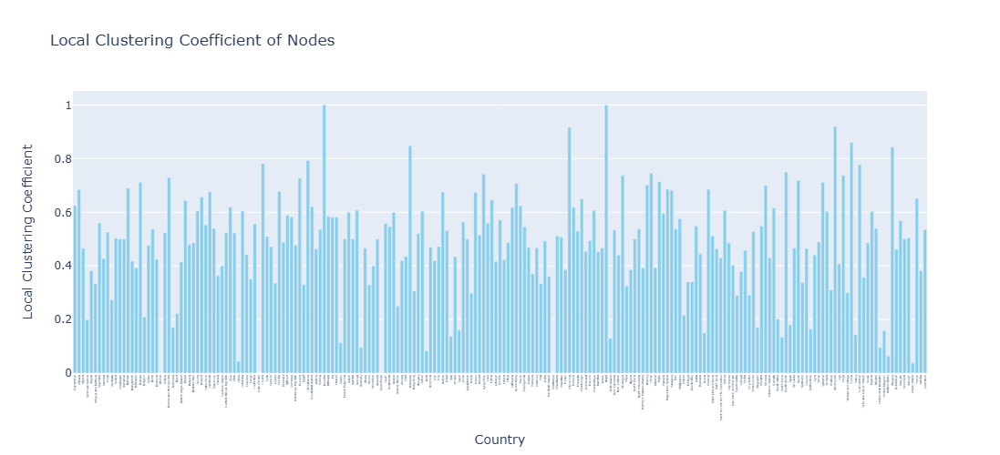

Nodes (Countries) with High Local Clustering Coefficient (> 0.7):
Eswatini: 1.0000
Nepal: 1.0000
Timor-Leste: 0.9200
Micronesia: 0.9167
Tunisia: 0.8600
Honduras: 0.8485
Uruguay: 0.8438
El Salvador: 0.7927
Croatia: 0.7808
Turkmenistan: 0.7778
South Sudan: 0.7500
Oman: 0.7451
Kyrgyzstan: 0.7424
Nicaragua: 0.7381
Tonga: 0.7381
Bosnia and Herzegovina: 0.7294
Ecuador: 0.7273
Sudan: 0.7188
Palau: 0.7143
Tajikistan: 0.7121
Belarus: 0.7115
Luxembourg: 0.7073
Norway: 0.7019


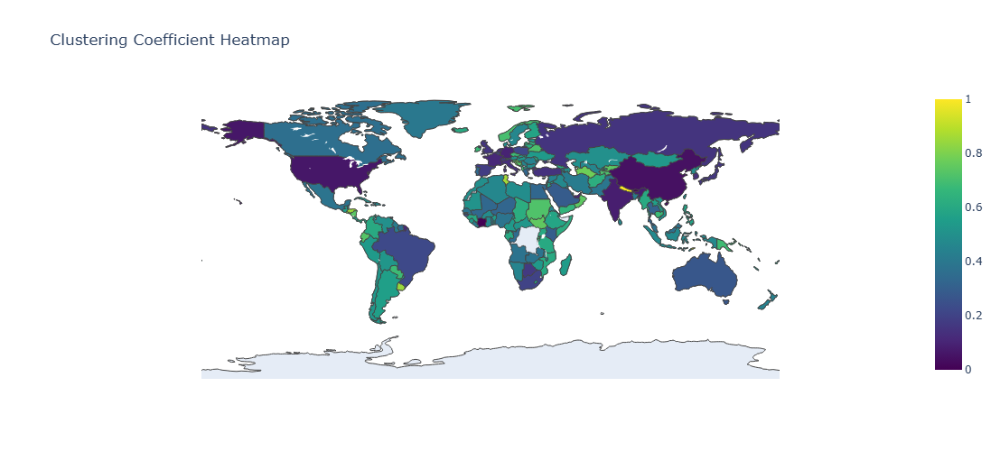

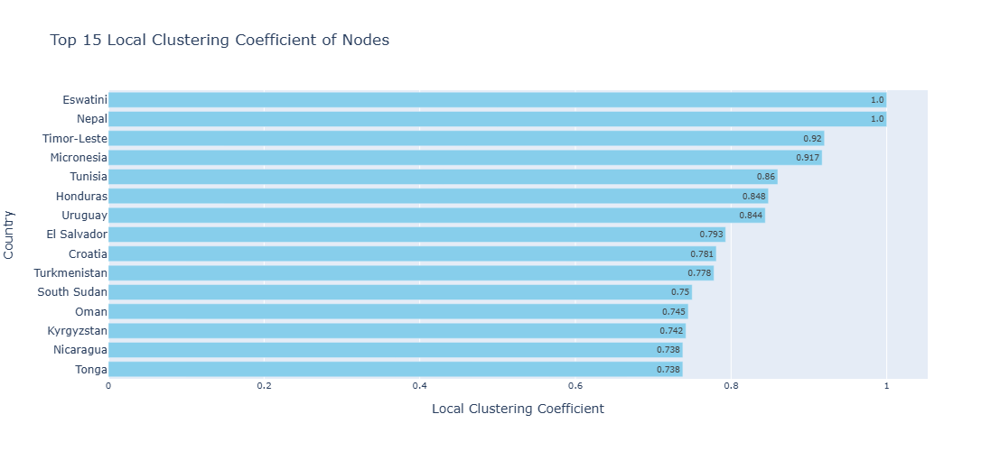

In [49]:
clustering_coeffs = nx.clustering(G)

high_clustering_nodes = centrality(clustering_coeffs, type='Local Clustering Coefficient',threshold=0.7, color='skyblue')
centrality_heatmap(clustering_coeffs, type='Clustering Coefficient')
top_centrality(clustering_coeffs, type='Local Clustering Coefficient', top_n=15, color='skyblue')

### Correlation between Local Clustering Coefficient and Degree Centrality

Is a measure of how these two properties are related across the nodes of a graph. Degree centrality measures the number of connections a node has, while the local clustering coefficient measures the tendency of a node's neighbors to be connected with each other. By examining their correlation, we can gain insights into the structural properties of the graph.

Key Metrics:

-Local Clustering Coefficient (LCC): Indicates how likely a country's trade partners are to trade with each other.

-Degree Centrality (DC): Represents the number of direct trade connections a country has.

Pearson correlation coefficient: -0.4811
P-value: 1.6601e-13


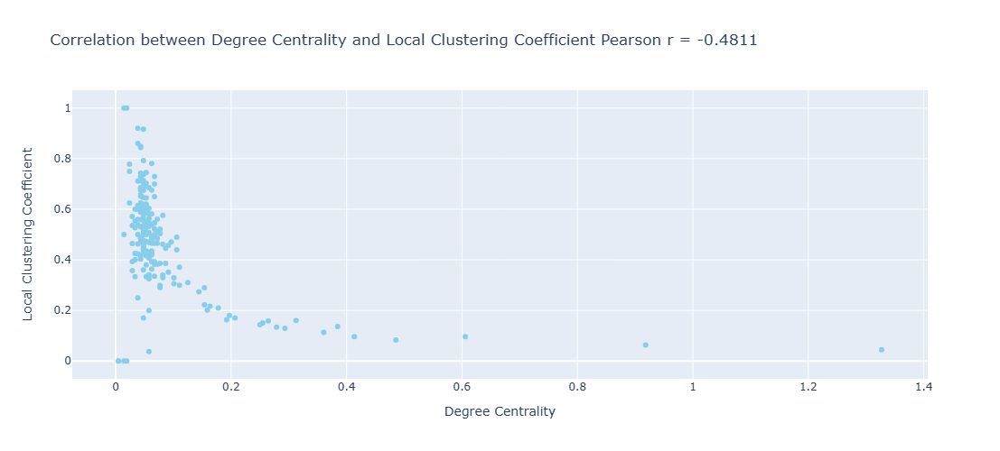

In [53]:
correlation, p_value = correlation_cd(clustering_coeffs, degree_centrality, color='skyblue')

## Small-World Effect

In [110]:
clustering_coefficient = nx.average_clustering(G)
print(f"Average Clustering Coefficient: {clustering_coefficient:.4f}")
avg_shortest_path_length = avg_shortestpath(G)

Average Clustering Coefficient: 0.4796
Average Shortest Path Length (average of strongly connected components): 2.2692


In [112]:
num_nodes = G.number_of_nodes()
num_edges = G.number_of_edges()
random_graph = nx.gnm_random_graph(num_nodes, num_edges, directed=True)

random_clustering_coefficient = nx.average_clustering(random_graph)
print(f"Random Graph Average Clustering Coefficient: {random_clustering_coefficient:.4f}")
random_avg_shortest_path_length = avg_shortestpath(random_graph)

Random Graph Average Clustering Coefficient: 0.0441
Average Shortest Path Length: 2.6870


In [114]:
print(f"Clustering Coefficient (G): {clustering_coefficient:.4f} vs. Random Graph: {random_clustering_coefficient:.4f}")
print(f"Average Shortest Path Length (G): {avg_shortest_path_length:.4f} vs. Random Graph: {random_avg_shortest_path_length:.4f}")

Clustering Coefficient (G): 0.4796 vs. Random Graph: 0.0441
Average Shortest Path Length (G): 2.2692 vs. Random Graph: 2.6870


## Strongly Connected Components

In [56]:
scc = nx.strongly_connected_components(G)
print(f'{list(scc)}')

[{'Guadeloupe'}, {'Martinique'}, {'Bahamas', 'El Salvador', 'Ukraine', 'Hong Kong', 'Mali', 'Belgium', 'Tuvalu', 'Marshall Islands', 'Turkey', 'Sao Tome and Principe', 'Macau', 'Greenland', 'Tunisia', 'Latvia', 'Slovakia', 'Aruba', 'Nicaragua', 'Belarus', 'Saint Vincent and the Grenadines', 'Honduras', 'Chile', 'Nigeria', 'Serbia', 'Sierra Leone', 'Turks and Caicos Islands', 'Tonga', 'Australia', 'Libya', 'Curacao', 'Italy', 'Tanzania', 'Cambodia', 'Luxembourg', 'Ireland', 'Israel', 'Benin', 'Iceland', 'Grenada', 'Bosnia and Herzegovina', 'North Macedonia', 'Burkina Faso', 'Timor-Leste', 'Gambia', 'Romania', 'Chad', 'Zimbabwe', 'Palau', 'Gabon', 'Cabo Verde', 'Netherlands', 'Austria', 'Solomon Islands', 'Armenia', 'Seychelles', 'Botswana', 'Croatia', 'Albania', 'Taiwan', 'Vietnam', 'Finland', 'Portugal', 'Ecuador', 'Papua New Guinea', 'Iraq', 'Angola', 'Namibia', 'Malaysia', 'American Samoa', 'Germany', 'Mexico', 'Cuba', 'Paraguay', 'Hungary', 'Norway', 'Bangladesh', 'Moldova', 'Somali

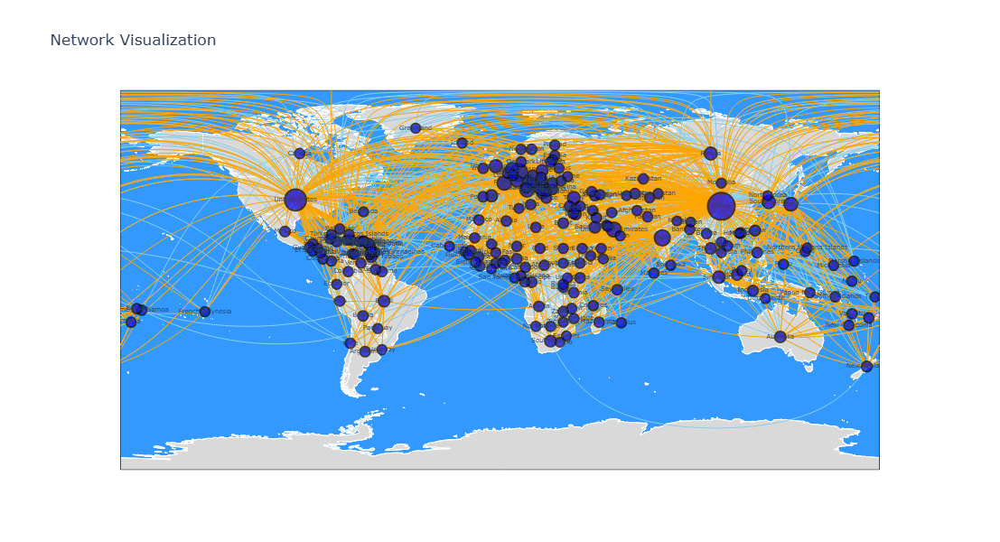

In [59]:
plot_network_on_world_map(G, degree_centrality, cliques=scc)

## K-core and core periphery structures

K-core decomposition is used to identify subgraphs within the network that are more densely connected. The k-core of a graph is a maximal subgraph in which each node has at least degree k. By analyzing k-cores, we can identify the most influential and interconnected nodes within the trade network. These core nodes are crucial for understanding the backbone of the trade network, as they often represent countries with strong and diverse trade relationships.

In [62]:
core, highest_core = kcores(G, 3, 20)


Nodes in the 3-core (207 elements): ['Afghanistan', 'Albania', 'Algeria', 'American Samoa', 'Angola', 'Antigua and Barbuda', 'Argentina', 'Armenia', 'Aruba', 'Australia', 'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain', 'Bangladesh', 'Barbados', 'Belarus', 'Belgium', 'Belize', 'Benin', 'Bermuda', 'Bhutan', 'Bolivia', 'Bosnia and Herzegovina', 'Botswana', 'Brazil', 'British Virgin Islands', 'Brunei', 'Bulgaria', 'Burkina Faso', 'Burma', 'Burundi', 'Cabo Verde', 'Cambodia', 'Cameroon', 'Canada', 'Cayman Islands', 'Central African Republic', 'Chad', 'Chile', 'China', 'Colombia', 'Comoros', 'Congo', 'Costa Rica', "Cote d'Ivoire", 'Croatia', 'Cuba', 'Curacao', 'Cyprus', 'Czechia', 'Denmark', 'Djibouti', 'Dominica', 'Dominican Republic', 'Ecuador', 'Egypt', 'El Salvador', 'Equatorial Guinea', 'Eritrea', 'Estonia', 'Eswatini', 'Ethiopia', 'Fiji', 'Finland', 'France', 'French Polynesia', 'Gabon', 'Gambia', 'Georgia', 'Germany', 'Ghana', 'Greece', 'Greenland', 'Grenada', 'Guam', 'Guatemala', 'Gu

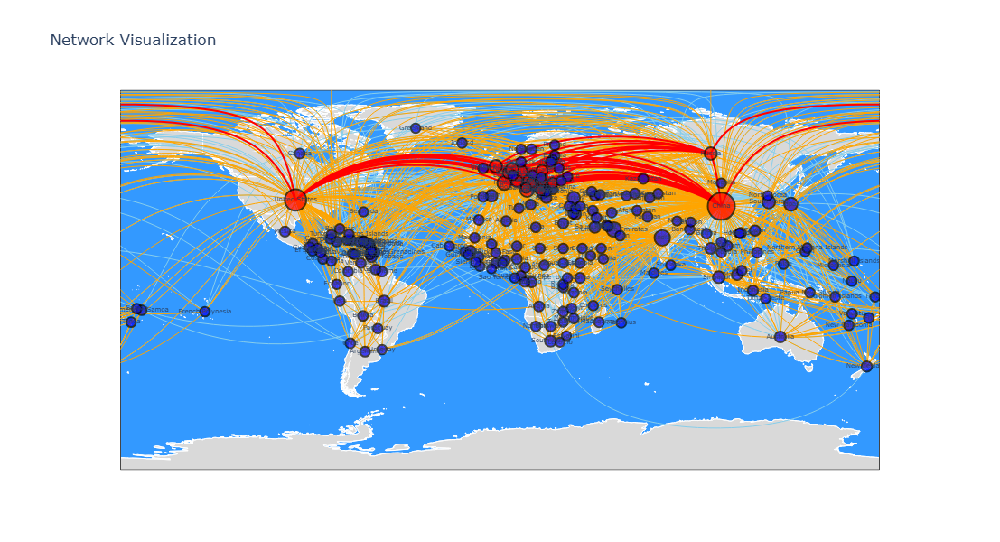

In [63]:
plot_network_on_world_map(G, degree_centrality, cliques=highest_core)

## Assortative mixing by degree

Assortative mixing by degree measures the tendency of nodes to connect to other nodes that are similar in degree. In the context of trade networks, this can indicate whether countries with similar trade volumes tend to trade with each other. High assortative mixing suggests that countries with high trade volumes (high-degree nodes) tend to trade more with other high-volume countries, while low assortative mixing might indicate a more diverse set of trade partners irrespective of trade volume.

In [66]:
assortativity_coefficient = nx.degree_assortativity_coefficient(G)

print(f"Assortative Mixing by Degree: {assortativity_coefficient:.4f}")

Assortative Mixing by Degree: -0.2882


### Visualize the degree correlations

Degree correlation measures the relationship between a node's degree and the average degree of its neighbors. This can help in understanding how nodes are connected within the network. In trade networks, it helps to analyze whether countries with many trade connections (high-degree nodes) tend to be connected to other well-connected countries or to less connected countries. This information can reveal the structural properties of the trade network, such as the presence of hubs or clusters.

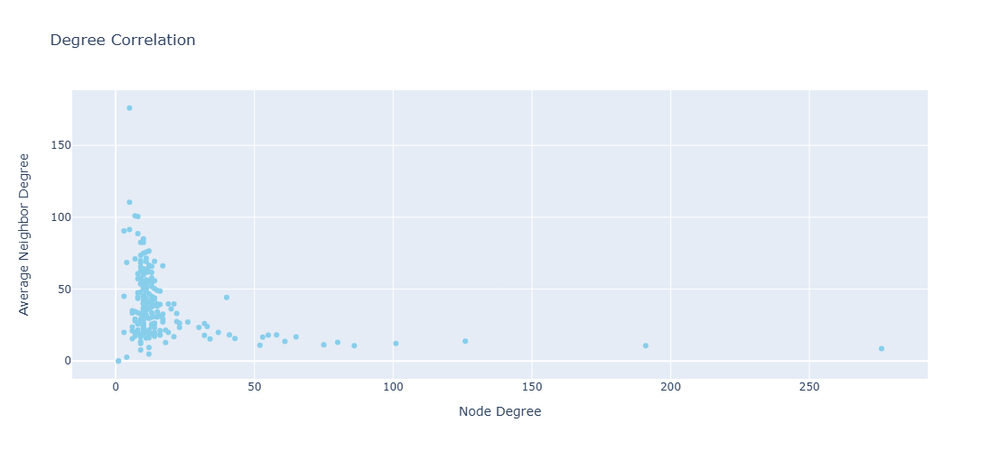

In [69]:
deg_cor(G)

## Density

Graph density is a measure of how many edges are present in the graph compared to the maximum possible number of edges. It gives a sense of how "dense" or "sparse" the network is. In the context of trade networks, density indicates the overall connectivity among countries. A denser network suggests that there are more trade relationships between countries, indicating a more interconnected and potentially robust global trade system.

In [72]:
graph_density = nx.density(G)

print(f"Graph Density: {graph_density:.4f}")

Graph Density: 0.0425


# Attributes Analysis and Comparisons

In [74]:
# Extracting data for histograms
gdp_data = extract_node_attributes(G, 'GDP')
exports_dollars_data = extract_node_attributes(G, 'Exports $')
imports_dollars_data = extract_node_attributes(G, 'Imports $')
exports_gdp_percentage_data = extract_node_attributes(G, 'Exports GDP%')
imports_gdp_percentage_data = extract_node_attributes(G, 'Imports GDP%')

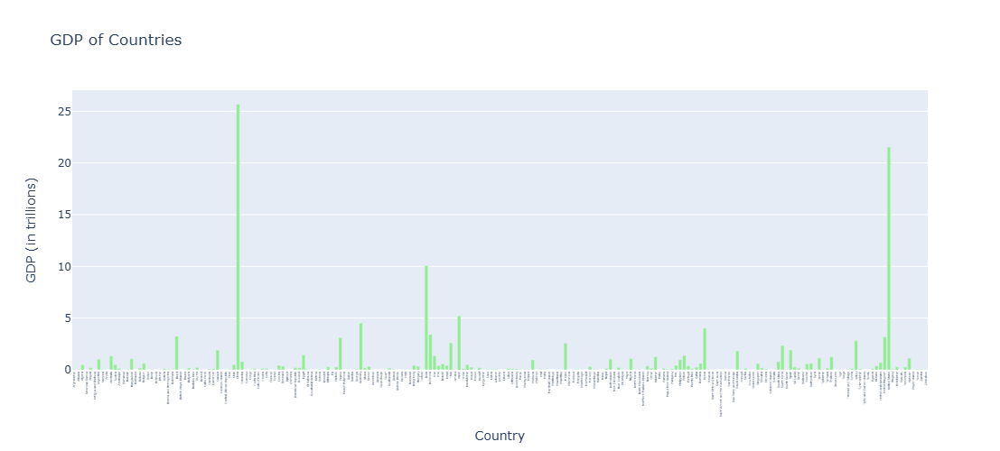

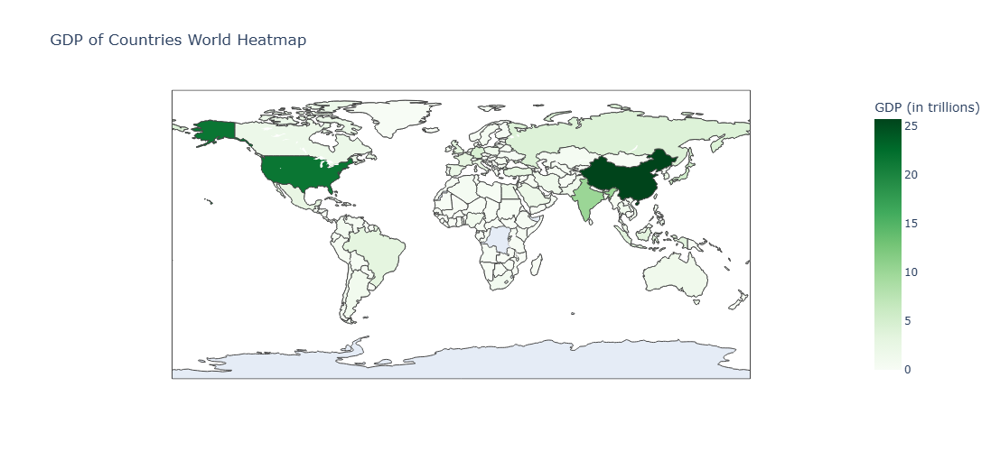

In [75]:
plot_attributes(gdp_data, 'GDP of Countries', 'Country', 'GDP (in trillions)', 'lightgreen','greens')

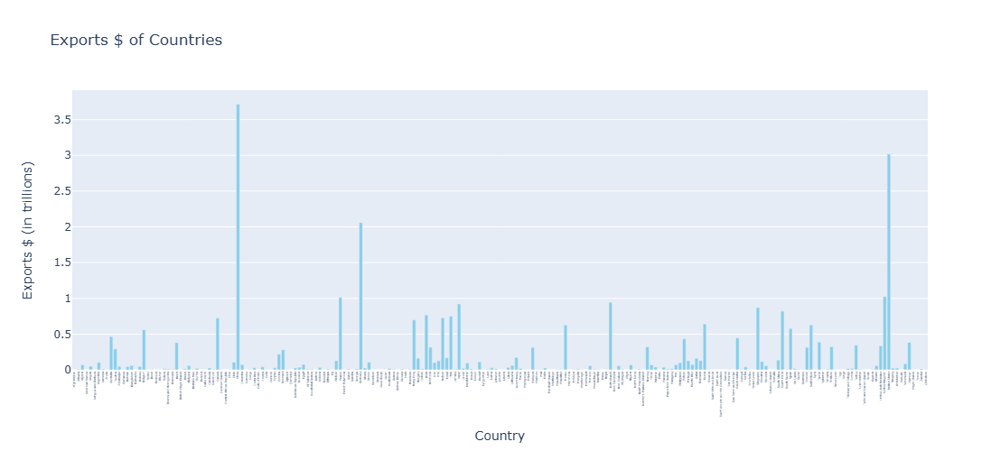

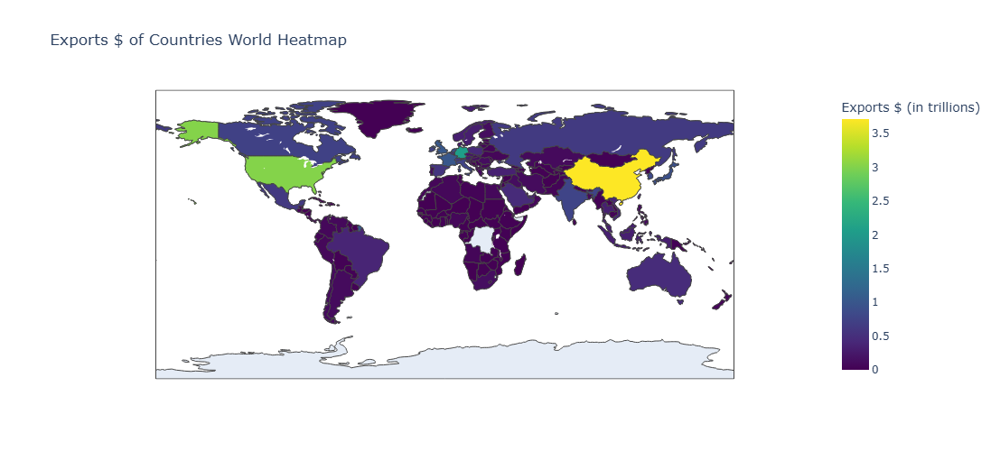

In [76]:
plot_attributes(exports_dollars_data, 'Exports $ of Countries', 'Country', 'Exports $ (in trillions)')

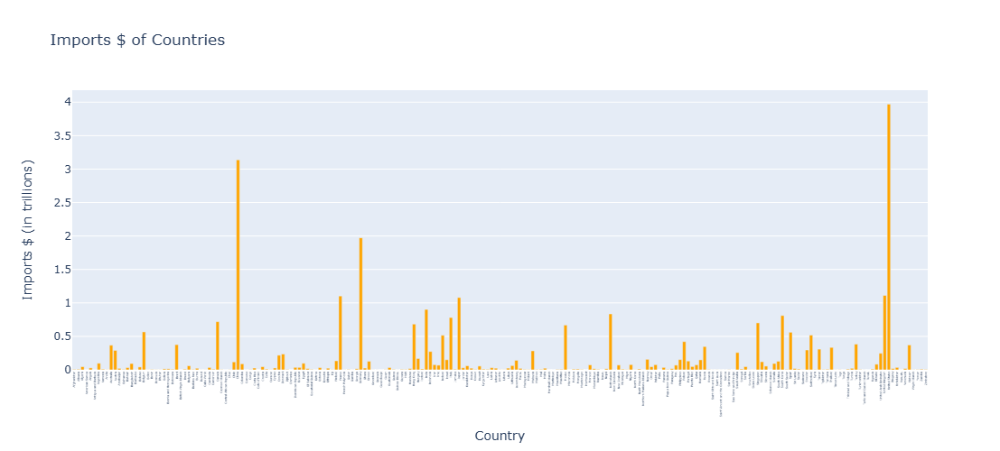

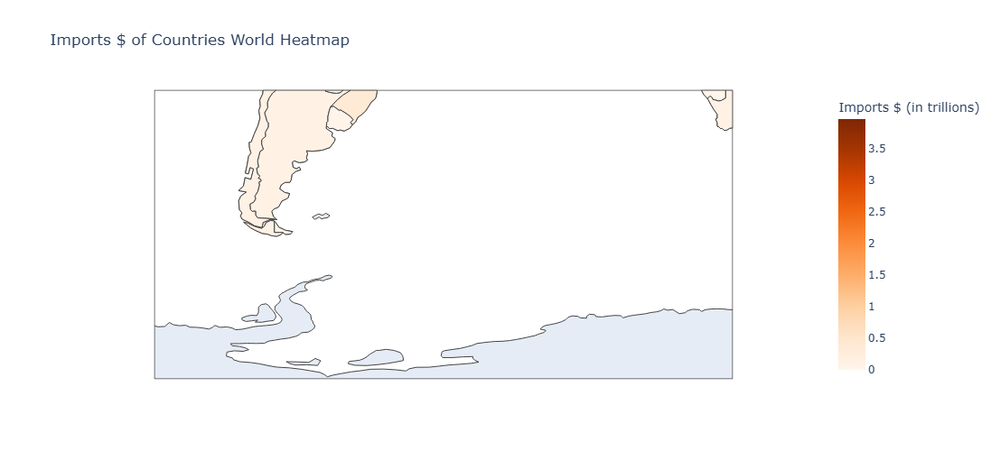

In [77]:
plot_attributes(imports_dollars_data, 'Imports $ of Countries', 'Country', 'Imports $ (in trillions)', 'orange', 'oranges')

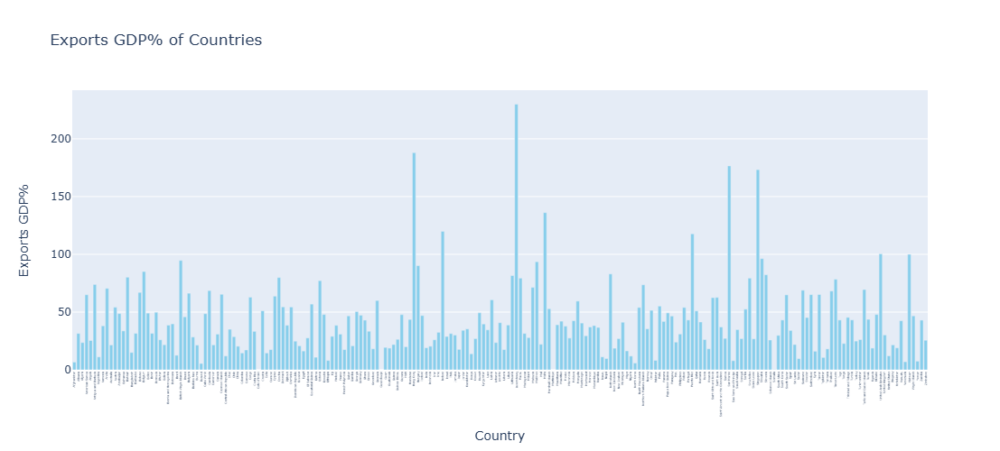

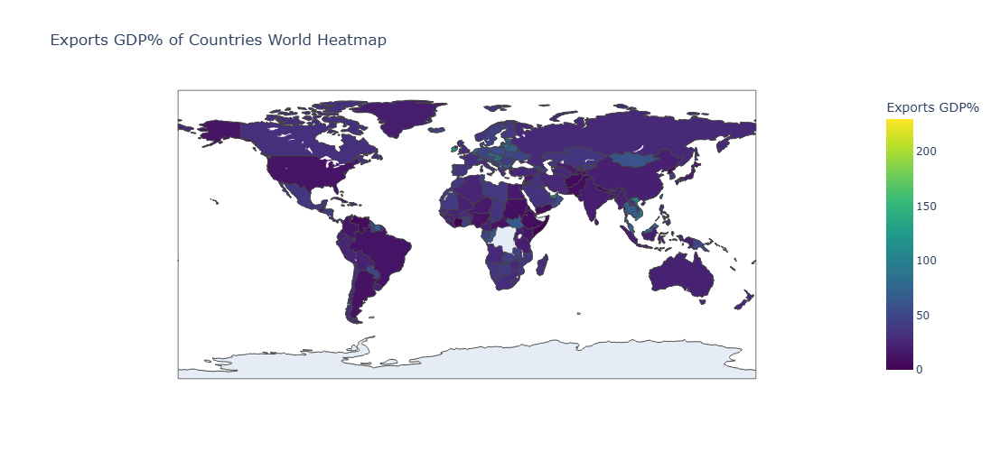

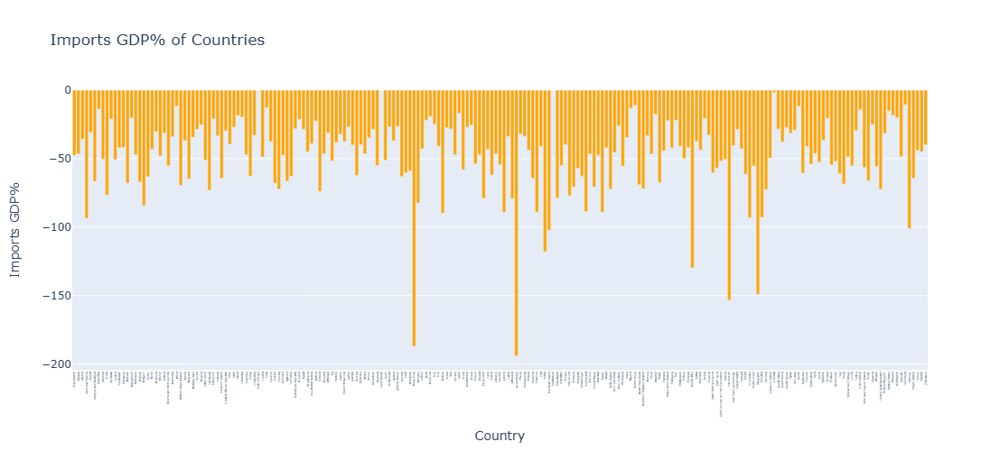

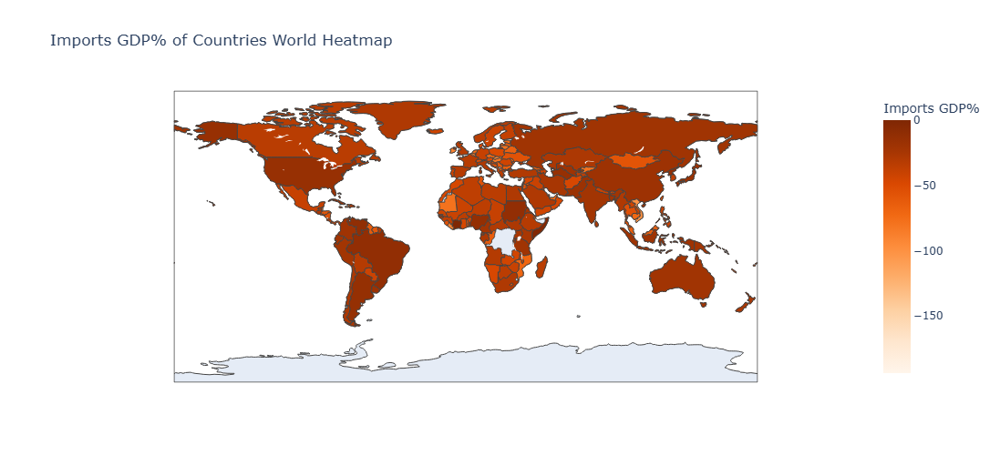

In [78]:
exports_gdp_percentage_data = {k: float(v) for k, v in exports_gdp_percentage_data.items()}
imports_gdp_percentage_data = {k: float(v) for k, v in imports_gdp_percentage_data.items()}
plot_attributes(exports_gdp_percentage_data, 'Exports GDP% of Countries', 'Country', 'Exports GDP%', 'skyblue')
plot_attributes(imports_gdp_percentage_data, 'Imports GDP% of Countries', 'Country', 'Imports GDP%', 'orange', 'oranges')

## Commodities

In [80]:
commodity_counts_export, commodity_counts_import = analyze_commodities(node_attributes)
print(commodity_counts_export.most_common(20))

[('refined petroleum', 80), ('gold', 65), ('crude petroleum', 46), ('natural gas', 36), ('packaged medicines', 30), ('lumber', 22), ('copper', 18), ('cars and vehicle parts', 18), ('integrated circuits', 18), ('insulated wiring', 17), ('diamonds', 15), ('broadcasting equipment', 15), ('scrap iron', 14), ('iron alloys', 13), ('ships', 13), ('cars', 13), ('tuna', 13), ('clothing and apparel', 13), ('electricity', 11), ('fertilizers', 11)]


In [81]:
print(commodity_counts_import.most_common(20))

[('refined petroleum', 161), ('cars', 118), ('packaged medicines', 81), ('broadcasting equipment', 70), ('crude petroleum', 53), ('natural gas', 36), ('delivery trucks', 30), ('rice', 27), ('aircraft', 22), ('gold', 19), ('cars and vehicle parts', 19), ('ships', 18), ('jewelry', 15), ('wheat', 14), ('electricity', 13), ('integrated circuits', 13), ('clothing and apparel', 13), ('recreational boats', 10), ('iron', 10), ('palm oil', 9)]


### Common Commodities Between Countries and Commodity Frequency

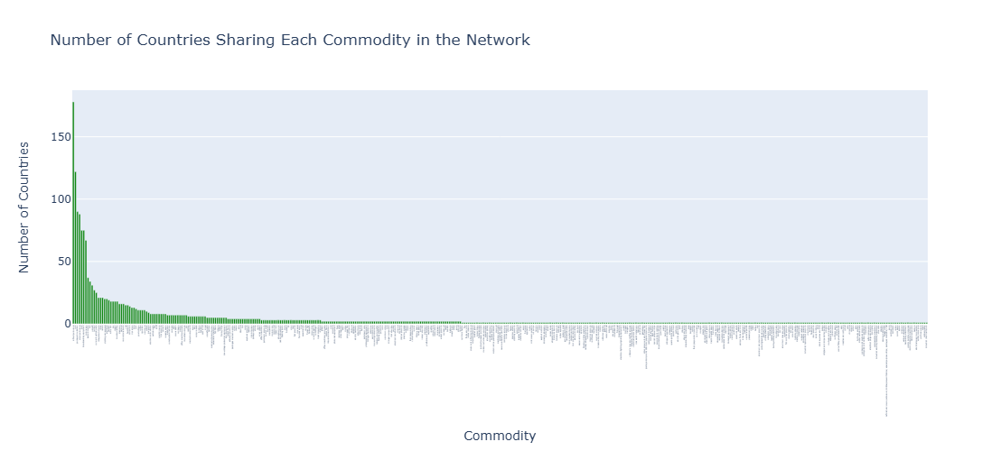

Commodity 'wheat flours' is shared by countries: Afghanistan, Saint Vincent and the Grenadines, Lesotho, Syria
Commodity 'cotton' is shared by countries: Afghanistan, Greece, Azerbaijan, Bangladesh, Benin, Togo, Burkina Faso, Mali, Sudan, Tajikistan
Commodity 'gold' is shared by countries: Afghanistan, United Arab Emirates, India, China, Uzbekistan, Turkey, United Kingdom, Australia, Ghana, Fiji, Singapore, South Africa, Suriname, Argentina, Armenia, Switzerland, Iraq, Malaysia, Jordan, Venezuela, Thailand, Azerbaijan, Bahrain, Saudi Arabia, Guyana, Benin, Canada, Bolivia, Peru, Colombia, Botswana, Hong Kong, Namibia, Burkina Faso, Burundi, Tanzania, Zambia, Cambodia, Cameroon, Cayman Islands, Central African Republic, Chad, Madagascar, Rwanda, Libya, Egypt, Dominican Republic, Honduras, Nicaragua, Eritrea, Eswatini, Ethiopia, Mali, Senegal, Guinea, Kazakhstan, Uganda, Kyrgyzstan, Laos, Lebanon, Liberia, Malawi, Mauritania, Mongolia, Mozambique, Niger, Oman, Papua New Guinea, Solomon I

In [121]:
commodity_to_countries, commodity_to_countries_export, commodity_to_countries_import = find_countries_with_common_commodities(G)

plot_common_commodities_histogram(commodity_to_countries, color='green')
print_common_commodities(commodity_to_countries)

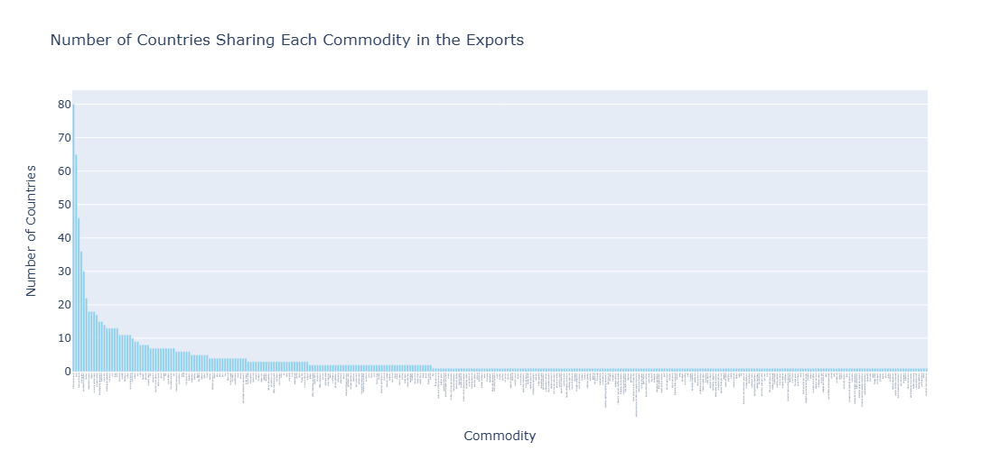

Commodity 'gold' is shared by countries: Afghanistan, United Arab Emirates, Uzbekistan, United Kingdom, Australia, Ghana, Fiji, Singapore, South Africa, Suriname, Argentina, Armenia, Switzerland, Iraq, Venezuela, Azerbaijan, Guyana, Benin, Canada, Bolivia, Peru, Colombia, Botswana, Hong Kong, Namibia, Burkina Faso, Burundi, Tanzania, Zambia, Cameroon, Cayman Islands, Central African Republic, Chad, Madagascar, Rwanda, Libya, Egypt, Dominican Republic, Honduras, Nicaragua, Eritrea, Eswatini, Ethiopia, Mali, Senegal, Guinea, Kazakhstan, Uganda, Kyrgyzstan, Laos, Lebanon, Liberia, Malawi, Mauritania, Mongolia, Mozambique, Niger, Papua New Guinea, Solomon Islands, Somalia, South Sudan, Sudan, Tajikistan, Yemen, Zimbabwe
Commodity 'grapes' is shared by countries: Afghanistan, Lebanon
Commodity 'cotton' is shared by countries: Afghanistan, Greece, Azerbaijan, Benin, Togo, Burkina Faso, Mali, Sudan, Tajikistan
Commodity 'coal' is shared by countries: Afghanistan, Australia, Indonesia, South A

In [123]:
plot_common_commodities_histogram(commodity_to_countries_export, name='Exports')
print_common_commodities(commodity_to_countries_export)

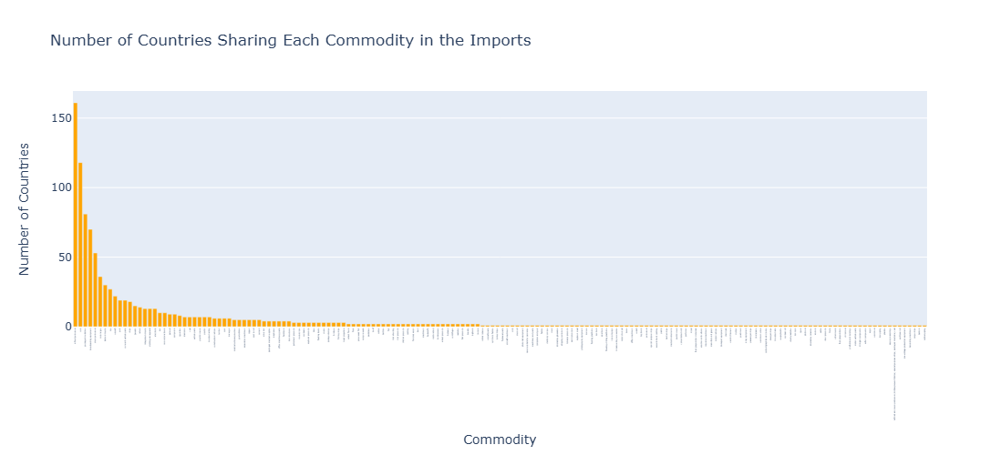

Commodity 'wheat flours' is shared by countries: Afghanistan, Syria
Commodity 'broadcasting equipment' is shared by countries: Afghanistan, United Arab Emirates, Germany, United States, Australia, Burma, Fiji, New Zealand, Kenya, South Africa, Poland, Chile, Armenia, Russia, Iraq, Netherlands, Iran, Jordan, Japan, Austria, Czechia, Israel, Bahrain, Saudi Arabia, Belarus, Ukraine, Togo, Luxembourg, Peru, Colombia, Hong Kong, Romania, Central African Republic, Chad, Rwanda, Costa Rica, Hungary, Libya, Slovakia, Denmark, Sweden, Norway, El Salvador, Honduras, Estonia, Finland, Latvia, Lithuania, Tonga, French Polynesia, Mali, Guam, Philippines, Kazakhstan, Kuwait, Kyrgyzstan, Maldives, Micronesia, Moldova, Montserrat, Nepal, Oman, Palau, Paraguay, Qatar, Somalia, Syria, Turkmenistan, Uruguay, Vanuatu
Commodity 'refined petroleum' is shared by countries: Afghanistan, United Arab Emirates, Pakistan, Uzbekistan, Albania, Italy, Spain, Greece, France, Turkey, Algeria, South Korea, Australia, 

In [125]:
plot_common_commodities_histogram(commodity_to_countries_import, name='Imports', color='orange')
print_common_commodities(commodity_to_countries_import)

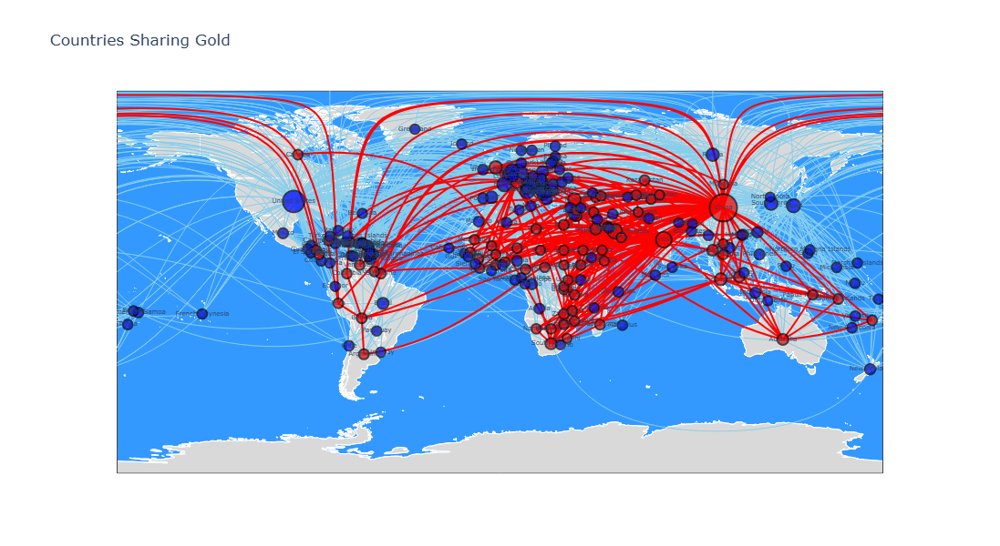

In [127]:
plot_commodity_on_world_map(G, degree_centrality, 'gold', title='Countries Sharing Gold')